# Ising2D

* Copyright (c) 2020 Gen Kuroki
* License: MIT
* Repository: https://github.com/genkuroki/Ising2D.jl

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Benchmarks" data-toc-modified-id="Benchmarks-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Benchmarks</a></span></li><li><span><a href="#Examples" data-toc-modified-id="Examples-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Examples</a></span></li><li><span><a href="#Documents" data-toc-modified-id="Documents-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Documents</a></span></li></ul></div>

In [1]:
if isfile("Project.toml")
    using Pkg
    Pkg.activate(".")
    using Revise
end

  Activating environment at `C:\Users\genkuroki\OneDrive\work\Ising2D.jl\Project.toml`
┌ Warning: no Manifest.toml file found, static paths used
└ @ Revise C:\Users\genkuroki\.julia\packages\Revise\moD4B\src\packagedef.jl:1361


In [2]:
using Ising2D, Plots, Random

## Benchmarks

IfElse() on v1.6.0-beta1.0:  8.496836 seconds (3 allocations: 25.781 KiB)


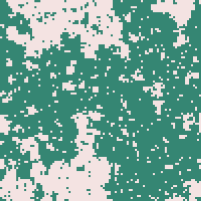

In [3]:
using Ising2D, Random
Random.seed!(464937337564)
print("IfElse() on v$VERSION:")
@time s = ising2d!(rand_ising2d(), β_ising2d, 10^5; algorithm=IfElse())
plot_ising2d(s)

MultiFor() on v1.6.0-beta1.0:  8.961295 seconds (2 allocations: 10.031 KiB)


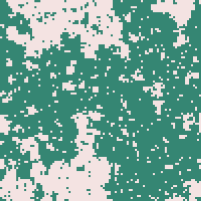

In [4]:
using Ising2D, Random
Random.seed!(464937337564)
print("MultiFor() on v$VERSION:")
@time s = ising2d!(rand_ising2d(), β_ising2d, 10^5; algorithm=MultiFor())
plot_ising2d(s)

In [5]:
using Ising2D, BenchmarkTools, Random
Random.seed!(464937337564)
s = rand_ising2d()
print("IfElse() on v$VERSION:")
@btime ising2d!($s; algorithm=IfElse());

IfElse() on v1.6.0-beta1.0:  83.516 ms (0 allocations: 0 bytes)


In [6]:
using Ising2D, BenchmarkTools, Random
Random.seed!(464937337564)
s = rand_ising2d()
print("MultiFor() on v$VERSION:")
@btime ising2d!($s; algorithm=MultiFor());

MultiFor() on v1.6.0-beta1.0:  83.045 ms (0 allocations: 0 bytes)


## Examples

In [7]:
Random.seed!(464937337564);

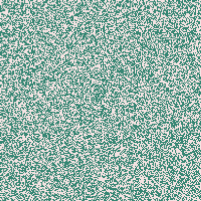

In [8]:
s = rand_ising2d(200)
P0 = plot_ising2d(s)

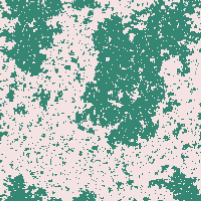

In [9]:
ising2d!(s, β_ising2d, 500)
P1 = plot_ising2d(s)

In [10]:
png(P0, "images/s0.png")
png(P1, "images/s1.png")

Progress: 100%|█████████████████████████████████████████| Time: 0:01:11
┌ Info: Saved animation to 
│   fn = C:\Users\genkuroki\OneDrive\work\Ising2D.jl\images\ising2d.gif
└ @ Plots C:\Users\genkuroki\.julia\packages\Plots\oZheM\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\genkuroki\\OneDrive\\work\\Ising2D.jl\\images\\ising2d.gif")
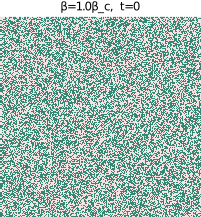

In [11]:
s = rand_ising2d(200)
gif_ising2d(s=s, k=1.0, nwarmups=0, nskips=1, niters=500, fps=15,
    gifname="images/ising2d.gif")

energy_density_ising2d(s₀) = 0.0056
magnetization_ising2d(s₀) = -0.022


mcmc_ising2d!: 100%|████████████████████████████████████| Time: 0:00:43


mean(E) = -1.41857872
mean(M) = -0.047587400000000016


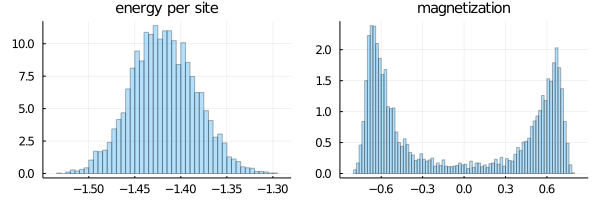

In [12]:
s₀ = rand_ising2d()
@show energy_density_ising2d(s₀)
@show magnetization_ising2d(s₀)
s = copy(s₀)
S = mcmc_ising2d!(s=s, k=1.0, nwarmups=1000, nskips=100, niters=5000)
E = energy_density_ising2d.(S)
M = magnetization_ising2d.(S)
@show mean(E)
@show mean(M)

histogram_mcmc_ising2d(S)

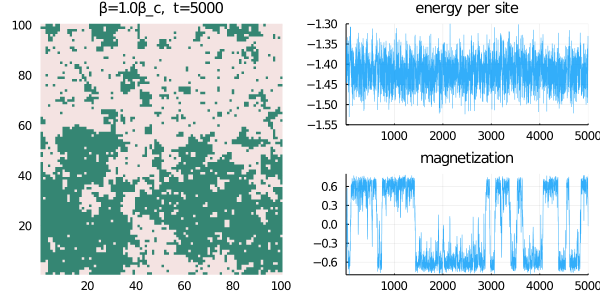

In [13]:
plot_mcmc_ising2d(S)

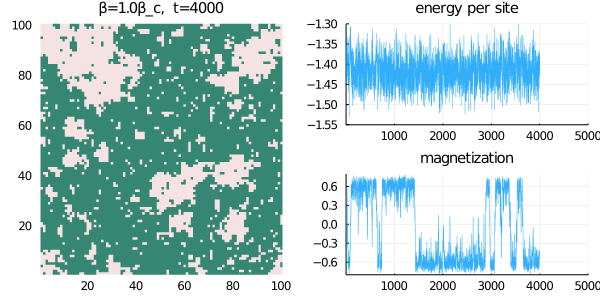

In [14]:
plot_mcmc_ising2d(S; t=4000)

@animate for:  100%|████████████████████████████████████| Time: 0:00:54
┌ Info: Saved animation to 
│   fn = C:\Users\genkuroki\OneDrive\work\Ising2D.jl\images\ising2d_mcmc.gif
└ @ Plots C:\Users\genkuroki\.julia\packages\Plots\oZheM\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\genkuroki\\OneDrive\\work\\Ising2D.jl\\images\\ising2d_mcmc.gif")
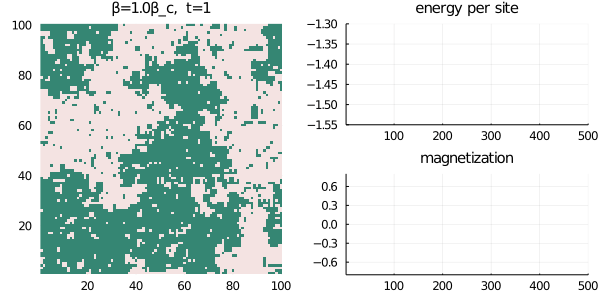

In [15]:
gif_mcmc_ising2d(S[10:10:end]; gifname="images/ising2d_mcmc.gif")

## Documents

In [16]:
?Ising2D

search: Ising2D ising2d! β_ising2d rand_ising2d plot_ising2d ones_ising2d



Ising2D is a simple Julia module of 2D Ising model.

Benchmark 1:

```julia
using Ising2D, BenchmarkTools
s = rand_ising2d()
print("VERSION = $VERSION:")
@btime ising2d!($s; algorithm=IfElse());
```

Benchmark 2:

```julia
using Ising2D, BenchmarkTools
s = rand_ising2d()
print("VERSION = $VERSION:")
@btime ising2d!($s; algorithm=MultiFor());
```


In [17]:
?Ising2D.β_ising2d

```
β_ising2d = log(1 + √2)/2
```

is the critical inverse temperature of 2D Ising model on the square lattice.


In [18]:
?Ising2D.rand_ising2d

```
rand_ising2d(rng::AbstractRNG, m=100, n=m)
rand_ising2d(m=100, n=m)
```

generate the random state of 2D Ising model.


In [19]:
?Ising2D.ones_ising2d

```
ones_ising2d(m=100, n=m)
```

generates the all-one state of 2D Ising model.


In [20]:
?Ising2D.ising2d!

```
ising2d!(s=rand_ising2d(), β=β_ising2d, niters=10^3, rng=default_rng();
    algorithm=default_algorithm())
```

updates the 2-dimensional array `s` with values ±1 randomly by 2D Ising model rule.

Example 1:

```julia
using Ising2D
@time s = ising2d!(rand_ising2d(), β_ising2d, 10^5)
plot_ising2d(s)
```

Example 2:

```julia
using Ising2D
@time s = ising2d!(rand_ising2d(), β_ising2d, 10^5; algorithm=IfElse())
plot_ising2d(s)
```

---

```
ising2d!(::IfElse, s=rand_ising2d(), β=β_ising2d, niters=10^3, rng=default_rng())
```

uses the algorithm using ifelse in only one for-loop.

Example:

```julia
s = ones_ising2d()
ising2d!(IfElse(), s)
plot_ising2d(s)
```

---

```
ising2d!(::MultiFor, s=rand_ising2d(), β=β_ising2d, niters=10^3, rng=default_rng())
```

uses the algorithm using multiple for-loops.

Example:

```julia
s = ones_ising2d()
ising2d!(MultiFor(), s)
plot_ising2d(s)
```


In [21]:
?Ising2D.plot_ising2d

```
plot_ising2d(s; size=(201.5, 201.5), color=:gist_earth, clim=(-2, 1.1), kwargs...)
```

plots the state `s` of 2D Ising model.


In [22]:
?Ising2D.gif_ising2d

```
gif_ising2d(; s=rand_ising2d(), k=1.0, β=k*β_ising2d, rng=default_rng(),
    algorithm=default_algorithm(), progress=true,
    nwarmups=0, nskips=10, niters=100, 
    gifname="ising2d.gif", fps=10,
    size=(201.5, 217.5), color=:gist_earth, clim=(-2, 1.1), kwargs...
)
```

creates the gif animation of 2D Ising model.

Example: To create a 200x200 GIF animation, run

```julia
gif_ising2d(s=rand_ising2d(200))
```


In [23]:
?Ising2D.mcmc_ising2d!

```
mcmc_ising2d!(; s=rand_ising2d(), k=1.0, β=k*β_ising2d, rng=default_rng(),
    algorithm=default_algorithm(), progress=true, 
    nwarmups=1000, nskips=100, niters=5000
)
```

returns the result of the Markov Chain Monte Carlo simulation with length niters, which is the array of the states of 2D Ising model.


In [24]:
?Ising2D.energy_density_ising2d

```
energy_ising2d(s)
```

returns the energy density (energy per site) of the state `s` of 2D Ising model.


In [25]:
?Ising2D.magnetization_ising2d

```
magnetization_ising2d(s)
```

returns the magnetization of the state `s` of 2D Ising model.


In [26]:
?Ising2D.plot_mcmc_ising2d

```
plot_mcmc_ising2d(S, E=nothing, M=nothing;
    k=1.0, β=k*β_ising2d, niters=length(S), t=niters,   
    ylim_E=(-1.50, -1.35), ylim_M=(-0.75, 0.75), lw=0.5, alpha=0.8,
    size=(600, 300), color=:gist_earth, clim=(-2, 1.1), kwargs...
)
```

plots the MCMC result S with energy per site and magnetization.


In [27]:
?Ising2D.histogram_mcmc_ising2d

```
histogram_mcmc_ising2d(S, E=nothing, M=nothing;
    niters=length(S), bin=min(100, max(10, round(Int, 1.2*√niters))), 
    size=(600, 200), kwargs...
)
```

plots the histogram of energy per site and magnetization of the MCMC result S.


In [28]:
?Ising2D.gif_mcmc_ising2d

```
gif_mcmc_ising2d(S=nothing, E=nothing, M=nothing;
    s=rand_ising2d(), k=1.0, β=k*β_ising2d, rng=default_rng(),
    algorithm=default_algorithm(), progress=true,
    nwarmups=1000, nskips=1000, niters=500,
    ylim_E=(-1.55, -1.30), ylim_M=(-0.8, 0.8), lw=1.0, alpha=0.8,
    gifname="ising2d_mcmc.gif", fps=10,
    size=(600, 300), color=:gist_earth, clim=(-2, 1.1), kwargs...
)
```

creates the gif animation of 2D Ising model with energy per site and magnetization.

Example:

```
gif_mcmc_ising2d()
```
